In [338]:
import pandas as pd
import numpy as np
import seaborn as sns
%matplotlib inline

Pour réaliser les exercices de ce noteboook, il sera utile de regarder les liens des ressources et la documentation de sklearn et de pandas.

# Import data and get into column format

In [339]:
# read the following file 'ESP_PUBLIC.IDENTITE_ARBRE.csv' from the website in Resources C
# and store the content in a dataframe variable named df
df = pd.read_csv("../data/ESP_PUBLIC.IDENTITE_ARBRE.csv")

In [340]:
# explain what the following line does in a markdown cell below: 
# what is the input, what is the output, which is the type of the output
df.GeoJSON[0]

'{"type":"Point","coordinates":[5.71991868316333,45.1902373901707]}'

In [341]:
# display the first 5 lines of the file
df.head(5)

,ELEM_POINT_ID,CODE,NOM,GENRE,GENRE_DESC,CATEGORIE,CATEGORIE_DESC,SOUS_CATEGORIE,SOUS_CATEGORIE_DESC,CODE_PARENT,...,COURRIER,IDENTIFIANTPLU,TYPEIMPLANTATIONPLU,INTITULEPROTECTIONPLU,ANNEEABATTAGE,ESSOUCHEMENT,DIAMETREARBRE,CAUSEABATTAGE,COLLECTIVITE,GeoJSON
0,32215,ESP32919,ESP32919,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,"{""type"":""Point"",""coordinates"":[5.7199186831633..."
1,32214,ESP32918,ESP32918,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,"{""type"":""Point"",""coordinates"":[5.7199940483740..."
2,32213,ESP32917,ESP32917,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,"{""type"":""Point"",""coordinates"":[5.7200063674702..."
3,32212,ESP32916,ESP32916,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,"{""type"":""Point"",""coordinates"":[5.7199594073925..."
4,32211,ESP32915,ESP32915,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,"{""type"":""Point"",""coordinates"":[5.720047467919,..."


**explanations here**

In [342]:
import json
x = json.loads('{"foo" : "bar", "hello" : "world"}')
type(x)

dict

In [343]:
# change the json string to a python dictionary on each of the values in the GeoJSON Column using "apply"
def str_to_json(x):
    return json.loads(x)

df["GeoJSON"] = df["GeoJSON"].apply(str_to_json)

In [344]:
# display the coordinates of the first element in the GeoJSON column
df["GeoJSON"][0]["coordinates"]

[5.71991868316333, 45.1902373901707]

In [345]:
# import pandas as pd
# use  pandas.io.json.json_normalize  to normalize the json coordinates into a new variable "coord"
result = pd.io.json.json_normalize(df["GeoJSON"])

df["type"] = result["type"]
df["coord"] = result["coordinates"]

In [346]:
def get_lon(x):
    return x[0]

def get_lat(x):
    return x[1]

In [347]:
# store the longitude and latitude in two variables starting from the values in the "coord" variable using "apply"
longitude = df["coord"].apply(get_lon)
latitude = df["coord"].apply(get_lat)

In [348]:
# remove the GeoJSON column from the dataframe df without copying it.
df.drop(columns=["GeoJSON"],inplace=True)

In [349]:
# define two new cols for the LONGITUDE and LATITUDE 
# and assign them the values contained in the variables longitude and latitude
df["longitude"] = longitude
df["latitude"] = latitude

# Investigate data 

Run and explain the result of the following python cell in the space below


In [350]:
df.head()

,ELEM_POINT_ID,CODE,NOM,GENRE,GENRE_DESC,CATEGORIE,CATEGORIE_DESC,SOUS_CATEGORIE,SOUS_CATEGORIE_DESC,CODE_PARENT,...,INTITULEPROTECTIONPLU,ANNEEABATTAGE,ESSOUCHEMENT,DIAMETREARBRE,CAUSEABATTAGE,COLLECTIVITE,type,coord,longitude,latitude
0,32215,ESP32919,ESP32919,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.71991868316333, 45.1902373901707]",5.719919,45.190237
1,32214,ESP32918,ESP32918,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.71999404837408, 45.1902804861137]",5.719994,45.190280
2,32213,ESP32917,ESP32917,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.72000636747023, 45.1903222955413]",5.720006,45.190322
3,32212,ESP32916,ESP32916,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.71995940739258, 45.1903592495204]",5.719959,45.190359
4,32211,ESP32915,ESP32915,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.720047467919, 45.1904417102787]",5.720047,45.190442


show the first row of the dataframe

Run and explain the result of the following python cell in the space below


In [351]:
df.shape

(31953, 35)

show the size of the dataframe

Run and explain the results of the following python cells in the space below


In [352]:
df.isnull().sum()
df.isnull().sum(axis=1)

0        12
1        13
2        12
3        12
4        13
         ..
31948    13
31949    13
31950    13
31951    13
31952    13
Length: 31953, dtype: int64

show the total number of missing value per row and per columns

Run and explain the results of the following python cell in the space below


In [353]:
df.count()

ELEM_POINT_ID            31953
CODE                     31953
NOM                      31953
GENRE                    31953
GENRE_DESC               31953
CATEGORIE                31953
CATEGORIE_DESC           31953
SOUS_CATEGORIE           31953
SOUS_CATEGORIE_DESC      31953
CODE_PARENT              31953
CODE_PARENT_DESC         31953
ADR_SECTEUR              31953
BIEN_REFERENCE           31953
GENRE_BOTA               31724
ESPECE                   29929
VARIETE                   4215
STADEDEDEVELOPPEMENT     29778
EQUIPE                       0
REMARQUES                 1526
ANNEEDEPLANTATION        31400
RAISONDEPLANTATION        2749
TRAITEMENTCHENILLES       2290
COURRIER                     0
IDENTIFIANTPLU             606
TYPEIMPLANTATIONPLU        606
INTITULEPROTECTIONPLU      606
ANNEEABATTAGE                0
ESSOUCHEMENT                 0
DIAMETREARBRE                0
CAUSEABATTAGE                0
COLLECTIVITE             31768
type                     31953
coord   

show the total number of values per columns

Run and explain the result of the following python cell in the space below


In [354]:
df.dtypes

ELEM_POINT_ID              int64
CODE                      object
NOM                       object
GENRE                     object
GENRE_DESC                object
CATEGORIE                 object
CATEGORIE_DESC            object
SOUS_CATEGORIE            object
SOUS_CATEGORIE_DESC       object
CODE_PARENT               object
CODE_PARENT_DESC          object
ADR_SECTEUR                int64
BIEN_REFERENCE            object
GENRE_BOTA                object
ESPECE                    object
VARIETE                   object
STADEDEDEVELOPPEMENT      object
EQUIPE                   float64
REMARQUES                 object
ANNEEDEPLANTATION        float64
RAISONDEPLANTATION        object
TRAITEMENTCHENILLES       object
COURRIER                 float64
IDENTIFIANTPLU           float64
TYPEIMPLANTATIONPLU       object
INTITULEPROTECTIONPLU     object
ANNEEABATTAGE            float64
ESSOUCHEMENT             float64
DIAMETREARBRE            float64
CAUSEABATTAGE            float64
COLLECTIVI

explain the type of data in each columns

Run and explain the result of the following python cell in the space below


In [355]:
df.COLLECTIVITE.value_counts()

Ville de Grenoble           16222
Grenoble Alpes Métropole    15546
Name: COLLECTIVITE, dtype: int64

show the number of values in each type of data in column "collectivite"

## Quick plots

Use seaborn scatter to plot the data using *LONGITUDE* and *LATITUDE* as `x` and `y` axis and three features of your choice as `hue` parameter.

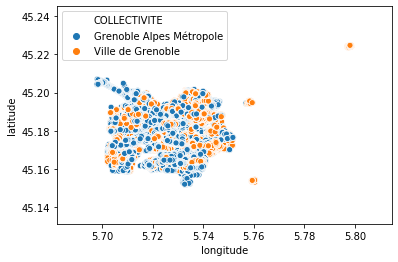

In [356]:
# code for plotting the first feature here
sns.scatterplot(df["longitude"],df["latitude"],hue=df.COLLECTIVITE)

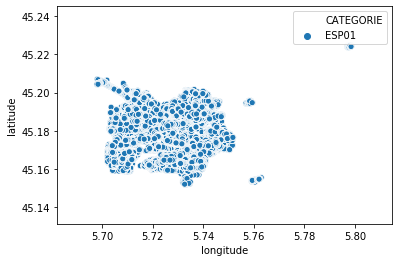

In [357]:
# code for plotting the second feature here
sns.scatterplot(df["longitude"],df["latitude"],hue=df.CATEGORIE)

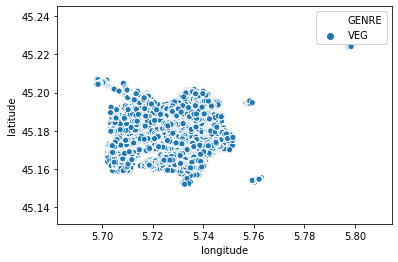

In [358]:
# code for plotting the third feature here
sns.scatterplot(df["longitude"],df["latitude"],hue=df.GENRE)

# Remove non- useful columns

Display the total number of lines in the dataframe

In [359]:
# code here
len(df)

31953

Display the columns names for columns with all missing values

*(please do it in one line...)*

In [360]:
# the line of code here
df.columns[df.isnull().any()]

Index(['GENRE_BOTA', 'ESPECE', 'VARIETE', 'STADEDEDEVELOPPEMENT', 'EQUIPE',
       'REMARQUES', 'ANNEEDEPLANTATION', 'RAISONDEPLANTATION',
       'TRAITEMENTCHENILLES', 'COURRIER', 'IDENTIFIANTPLU',
       'TYPEIMPLANTATIONPLU', 'INTITULEPROTECTIONPLU', 'ANNEEABATTAGE',
       'ESSOUCHEMENT', 'DIAMETREARBRE', 'CAUSEABATTAGE', 'COLLECTIVITE'],
      dtype='object')

Display the columns names for columns where there are no missing values

*(please do it in one line...)*

In [361]:
# the line of code here
df.columns[~df.isnull().any()]

Index(['ELEM_POINT_ID', 'CODE', 'NOM', 'GENRE', 'GENRE_DESC', 'CATEGORIE',
       'CATEGORIE_DESC', 'SOUS_CATEGORIE', 'SOUS_CATEGORIE_DESC',
       'CODE_PARENT', 'CODE_PARENT_DESC', 'ADR_SECTEUR', 'BIEN_REFERENCE',
       'type', 'coord', 'longitude', 'latitude'],
      dtype='object')

How many distinct values are there for the column GENRE_BOTA?

*(please do it in one line...)*

In [362]:
# code here
df["GENRE_BOTA"].value_counts()

Acer          5305
Platanus      4649
Pinus         2104
Tilia         1780
Fraxinus      1516
              ... 
Eucalyptus       1
Staphylea        1
Laurus           1
Castanea         1
Acacia           1
Name: GENRE_BOTA, Length: 119, dtype: int64

Where are the missing values?

Use the seaborn heatmap plot for displaying all missing values

In [363]:
# code here

In [364]:
import missingno as msno

Use the `matrix` and `heatmap` functions of the `missingno` library for displaying a heatmap, a missing values matrix and a dendrogram.

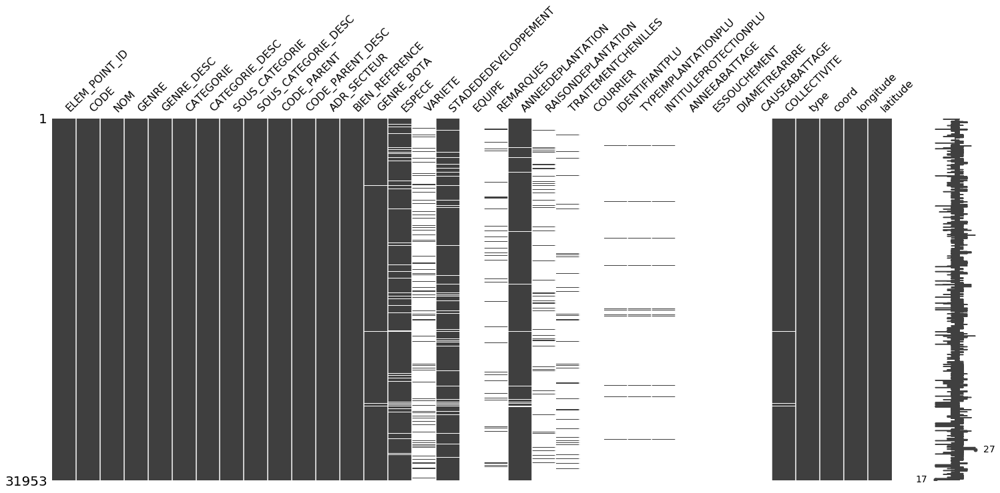

In [365]:
# code for displaying the matrix
msno.matrix(df)

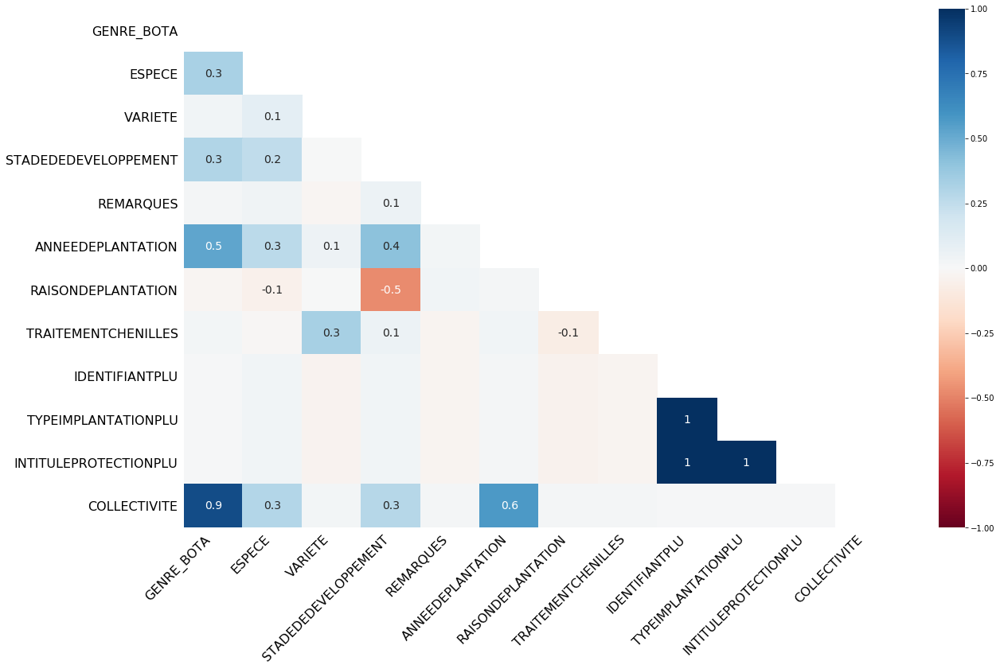

In [366]:
# code for displaying the heatmap
msno.heatmap(df)

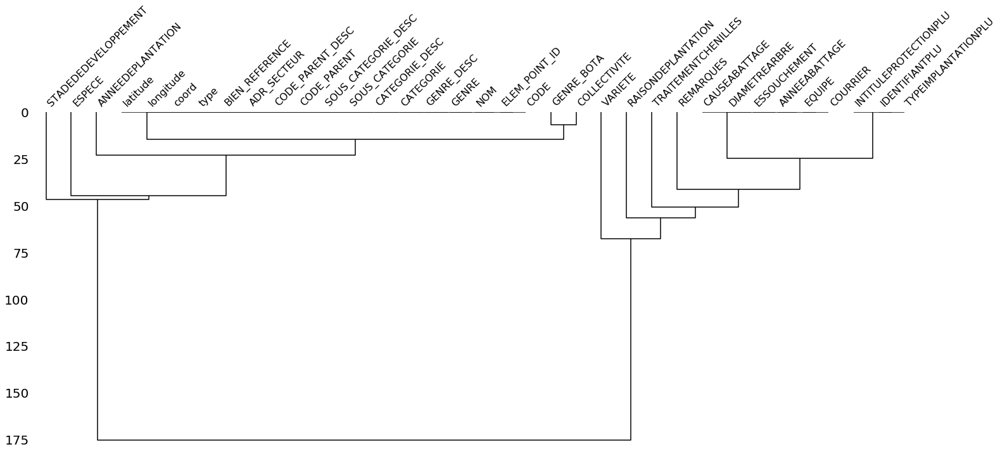

In [367]:
# code for displaying the dendrogram
msno.dendrogram(df)

Remove missing dates (in the column `ANNEDEPLANTATION`) and store the remaining dataframe in a variable named `clean`

In [368]:
# code here
clean = df.dropna(subset=["ANNEEDEPLANTATION"])


In [369]:
clean.head()

,ELEM_POINT_ID,CODE,NOM,GENRE,GENRE_DESC,CATEGORIE,CATEGORIE_DESC,SOUS_CATEGORIE,SOUS_CATEGORIE_DESC,CODE_PARENT,...,INTITULEPROTECTIONPLU,ANNEEABATTAGE,ESSOUCHEMENT,DIAMETREARBRE,CAUSEABATTAGE,COLLECTIVITE,type,coord,longitude,latitude
0,32215,ESP32919,ESP32919,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.71991868316333, 45.1902373901707]",5.719919,45.190237
1,32214,ESP32918,ESP32918,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.71999404837408, 45.1902804861137]",5.719994,45.190280
2,32213,ESP32917,ESP32917,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.72000636747023, 45.1903222955413]",5.720006,45.190322
3,32212,ESP32916,ESP32916,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.71995940739258, 45.1903592495204]",5.719959,45.190359
4,32211,ESP32915,ESP32915,VEG,VEGETATION,ESP01,Arbre,ESP151,Arbre de voirie,ESP32840,...,NaN,NaN,NaN,NaN,NaN,Grenoble Alpes Métropole,Point,"[5.720047467919, 45.1904417102787]",5.720047,45.190442


Inspect the shape of the cleaned dataframe

In [370]:
# code here
clean.shape

(31400, 35)

Remove empty columns (+ columns that are close to empty) 

A 'close to empty' column is a column with a total number of elements lower or equal to 28000.

Store the columns' names in a variable named `cols_list_clean`

In [371]:

count_na = len(df) - df.count()
count_na = count_na.loc[count_na<=28000]
cols_list_clean = count_na.index.values

In [372]:
cols_list_clean

array(['ELEM_POINT_ID', 'CODE', 'NOM', 'GENRE', 'GENRE_DESC', 'CATEGORIE',
       'CATEGORIE_DESC', 'SOUS_CATEGORIE', 'SOUS_CATEGORIE_DESC',
       'CODE_PARENT', 'CODE_PARENT_DESC', 'ADR_SECTEUR', 'BIEN_REFERENCE',
       'GENRE_BOTA', 'ESPECE', 'VARIETE', 'STADEDEDEVELOPPEMENT',
       'ANNEEDEPLANTATION', 'COLLECTIVITE', 'type', 'coord', 'longitude',
       'latitude'], dtype=object)

Replace the `clean` data frame by the subset containing only the cleaned columns, then inspect the first five elements of the dataframe.

In [373]:
# code here
clean = clean[cols_list_clean]

In [374]:
clean.shape

(31400, 23)

Find the columns that have one single value for all entries.

In [375]:
clean.drop(columns=["coord"],inplace=True)

In [376]:
# code here
clean.columns[clean.nunique()<=1]

Index(['GENRE', 'GENRE_DESC', 'CATEGORIE', 'CATEGORIE_DESC', 'type'], dtype='object')

Remove the following uninteresting columns - i.e ones that have all same values or references

In [377]:
uninteresting_cols = ['NOM','GENRE','GENRE_DESC','CATEGORIE', 'CATEGORIE_DESC', 'BIEN_REFERENCE']

In [378]:
# code here
clean.drop(columns=uninteresting_cols,inplace=True)

Find the number of distinct values in the `STADEDEDEVELOPPEMENT` column.

In [379]:
# code here
clean.STADEDEDEVELOPPEMENT.value_counts()

Arbre adulte          22341
Arbre jeune            7122
Arbre vieillissant      227
Name: STADEDEDEVELOPPEMENT, dtype: int64

NOTES

Features looking useful:
* sous_category looks useful (4 categories)
* ADR_SECTEUR (6 categories)
* STADEDEDEVELOPPEMENT (3 categories) 
* COLLECTIVITE (2 categories)


Less useful:
* CODE_PARENT_DESC (too many categories - ~1400, but could be usefull to make new featues (most common tree in local area etc).
* GENRE_BOTA (112 categories) 
* ESPECE(257 categories)
* VARIETE (183 cats but missing vals) 

In [380]:
# if you want you can display the whole clean dataframe here

For storing the dataframe in a csv file, use `clean.to_csv('./data/modified/first_clean.csv',index=False)`

In [381]:
clean.to_csv('../data/modified/first_clean.csv',index=False)

## Save out to pickle file

The file name should be 'trees_first_clean.pkl'

In [382]:
# code here
clean.to_pickle('../data/pickle/trees_first_clean.pkl')